In [0]:
# Change directory to VSCode workspace root so that relative path loads work correctly. Turn this addition off with the DataScience.changeDirOnImportExport setting
# ms-python.python added
import os
try:
	os.chdir(os.path.join(os.getcwd(), '..'))
	print(os.getcwd())
except:
	pass


In [1]:

import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn
from IPython.core.interactiveshell import InteractiveShell
from statsmodels.graphics.mosaicplot import mosaic

# Setting styles
InteractiveShell.ast_node_interactivity = "all"
sns.set(style="whitegrid", color_codes=True, rc={"figure.figsize": (12.7, 9.27)})


In [2]:

df = pd.read_csv(os.path.join("data", "processed", "clean.csv"), index_col="ID")


In [3]:

print("Shape of the data", df.shape)
df.head()


Shape of the data (30000, 24)


,credit_given,sex,education,marriage,age,pay_status0,pay_status2,pay_status3,pay_status4,pay_status5,...,bill_amt4,bill_amt5,bill_amt6,pay_amt1,pay_amt2,pay_amt3,pay_amt4,pay_amt5,pay_amt6,defaulted
ID,,,,,,,,,,,,,,,,,,,,,
1,20000,Female,University,Married,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
2,120000,Female,University,Single,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,90000,Female,University,Single,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,50000,Female,University,Married,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
5,50000,Male,University,Married,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [4]:

df.dtypes


credit_given     int64
sex             object
education       object
marriage        object
age              int64
pay_status0      int64
pay_status2      int64
pay_status3      int64
pay_status4      int64
pay_status5      int64
pay_status6      int64
bill_amt1        int64
bill_amt2        int64
bill_amt3        int64
bill_amt4        int64
bill_amt5        int64
bill_amt6        int64
pay_amt1         int64
pay_amt2         int64
pay_amt3         int64
pay_amt4         int64
pay_amt5         int64
pay_amt6         int64
defaulted        int64
dtype: object

In [5]:

print("almost not missing data")
df.isnull().sum()


almost not missing data


credit_given     0
sex              0
education       14
marriage        54
age              0
pay_status0      0
pay_status2      0
pay_status3      0
pay_status4      0
pay_status5      0
pay_status6      0
bill_amt1        0
bill_amt2        0
bill_amt3        0
bill_amt4        0
bill_amt5        0
bill_amt6        0
pay_amt1         0
pay_amt2         0
pay_amt3         0
pay_amt4         0
pay_amt5         0
pay_amt6         0
defaulted        0
dtype: int64

 # Default Rate

 * Default rate is quite high, but most people don't default

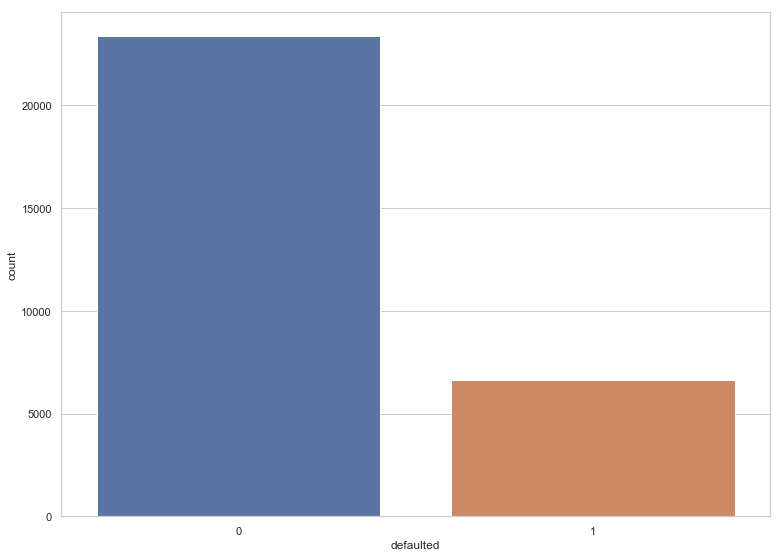

In [6]:

sns.countplot(x="defaulted", data=df)
plt.show()


 # Distribution of Credit Given

 * Most people have relatively small credit
 * Very few people have credit over 500000, but the right tail is long

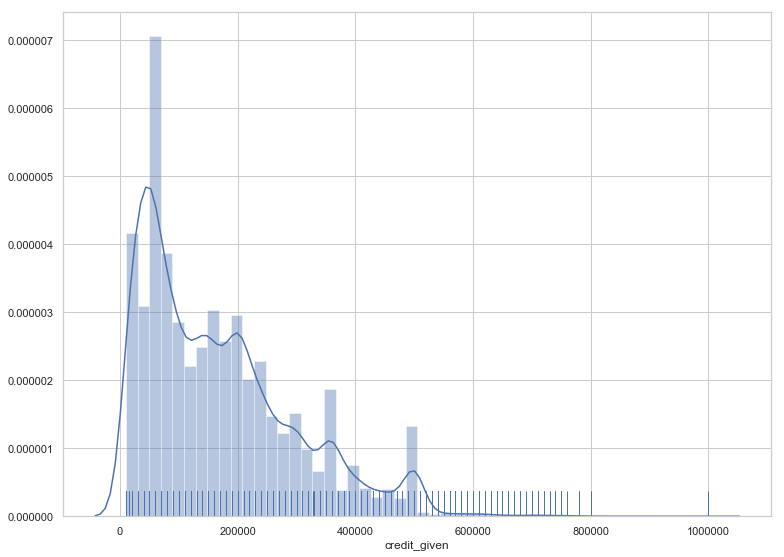

In [7]:

sns.distplot(df.credit_given, rug=True)
plt.show()


 # Demographic Information

 * More females than men
 * Marital status highly related to education, with more educated being more likely singe.
 This effect is less strong with men
 * There is a around 10 years age difference between married and single customers, with
 married people being unsurprisingly older
 * The distribution of age between genders in different demographic groups is very close
 * Males with university degrees default more often than women with university degrees
 * Women with graduate degrees default more often than men with graduate degrees

(<Figure size 914.4x667.44 with 3 Axes>,
 OrderedDict([(('Female', 'University', 'Married'),
               (0.0, 0.0, 0.30907919283923657, 0.47411416664748507)),
              (('Female', 'University', 'Single'),
               (0.31040787704578204,
                0.0,
                0.28198638344903515,
                0.47411416664748507)),
              (('Female', 'University', 'Others'),
               (0.5937229447013628,
                0.0,
                0.006842316657219258,
                0.47411416664748507)),
              (('Female', 'Graduate School', 'Married'),
               (0.0,
                0.4774144966804884,
                0.1950784904407896,
                0.34132274070980656)),
              (('Female', 'Graduate School', 'Single'),
               (0.19640717464733512,
                0.4774144966804884,
                0.4009093386224102,
                0.34132274070980656)),
              (('Female', 'Graduate School', 'Others'),
               (0.

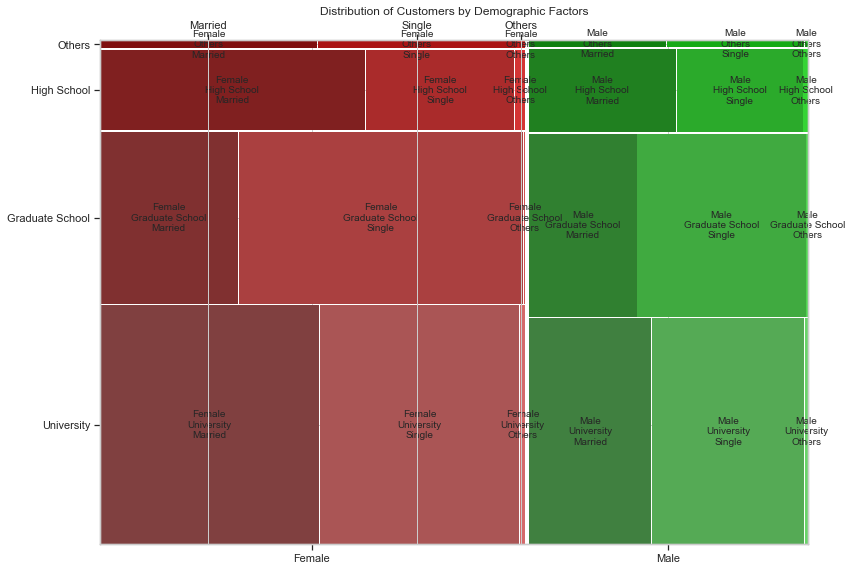

In [8]:

mosaic(
    df,
    ["sex", "education", "marriage"],
    title="Distribution of Customers by Demographic Factors",
)
plt.show()


/home/tuomo/anaconda3/envs/credit-risk-prediction/lib/python3.7/site-packages/seaborn/axisgrid.py:715: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


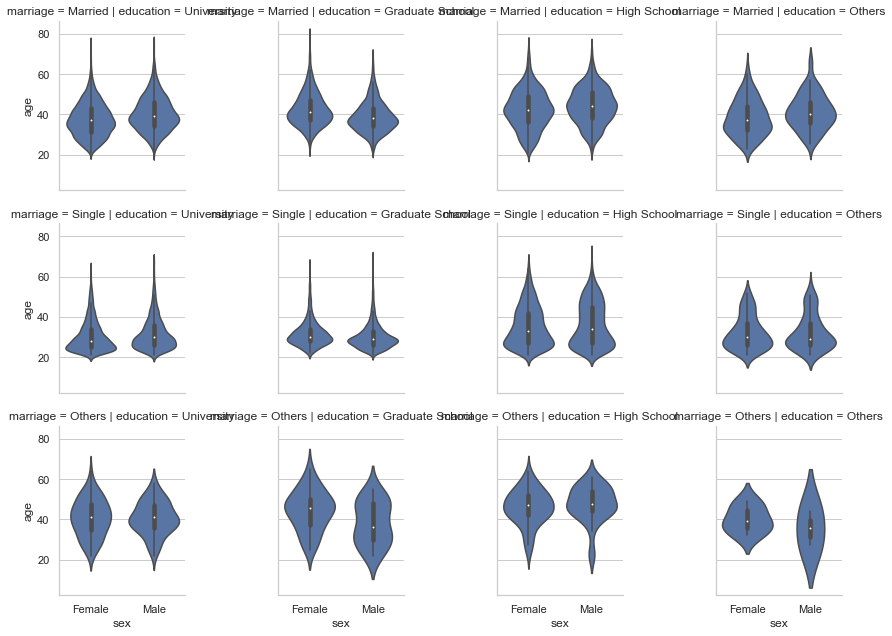

In [9]:

ax = sns.FacetGrid(df, col="education", row="marriage")
ax = ax.map(sns.violinplot, "sex", "age")
plt.show()


/home/tuomo/anaconda3/envs/credit-risk-prediction/lib/python3.7/site-packages/seaborn/axisgrid.py:715: UserWarning: Using the countplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


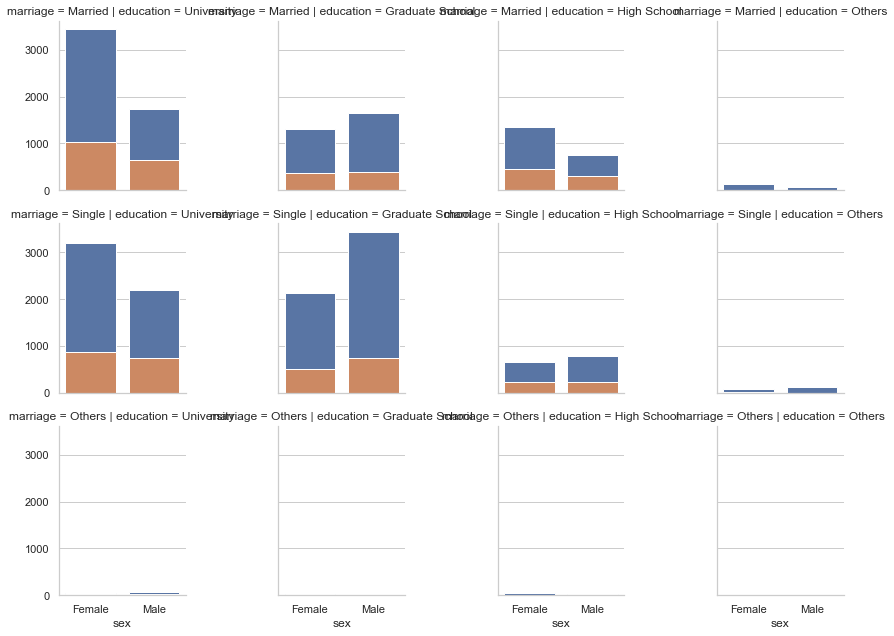

In [10]:

ax = sns.FacetGrid(df, col="education", row="marriage", hue="defaulted")
ax = ax.map(sns.countplot, "sex")
plt.show()



In [11]:

# # Relationship between the amount paid and the total bill in in different months
#
# * Total bill in different months highly correlated. This is because we are often talking about
# long term debts that not easily paid within few months
# * Amount paid is much less correlated than the amount of the bill. This means that people
# are not terribly consistant in the amount their debt payments
# The amount paid is quite correlated with the to the amount of the bill in the previous month.
# Peoples contributions are related to the immediate amount of debt


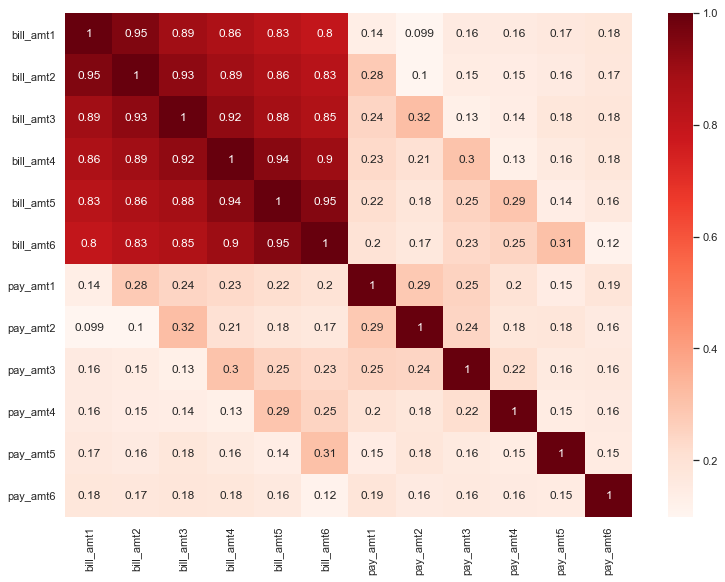

In [12]:

bill_amount_and_paid_cols = [
    "bill_amt1",
    "bill_amt2",
    "bill_amt3",
    "bill_amt4",
    "bill_amt5",
    "bill_amt6",
    "pay_amt1",
    "pay_amt2",
    "pay_amt3",
    "pay_amt4",
    "pay_amt5",
    "pay_amt6",
]

cor = df[bill_amount_and_paid_cols].corr()
sns.heatmap(cor, annot=True, cmap="Reds")
plt.show()



 # Big heatmap

 * Interestingly the bill amount is negative correlated with defaulting. Taking this naively
 would mean that giving people more credit will make them pay more likely!
 * Of course people who can pay get more credit and a bigger bill
 * We need to create some new feature that will capture the risk of giving big
 loans

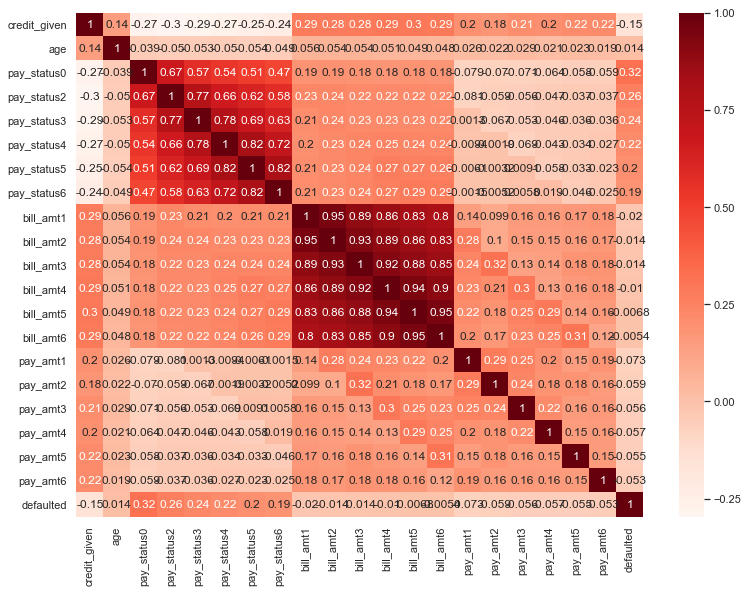

In [13]:

cor = df.select_dtypes(include=np.number).corr()
sns.heatmap(cor, annot=True, cmap="Reds")
plt.show()


 # Amount of Maximum Credit Used

 * If we divide the bill amount with the credit given we get how much of the credit is used. Logic here
 is that the more close people go to their maximum credit the more likely is that they default (that
 limit is there for a reason)
 * The bigger the proportion of credit used, the more likely the customer is to default
 * Bizarrely the farther we go in time the higher the correlation to defaulting is. This makes intuitively
 little sense as you would guess that the time when people are most likely to default is
 when they are closest to their credit limit
 * It is quite common for people to be at their credit limit and it is possible to even go above it!

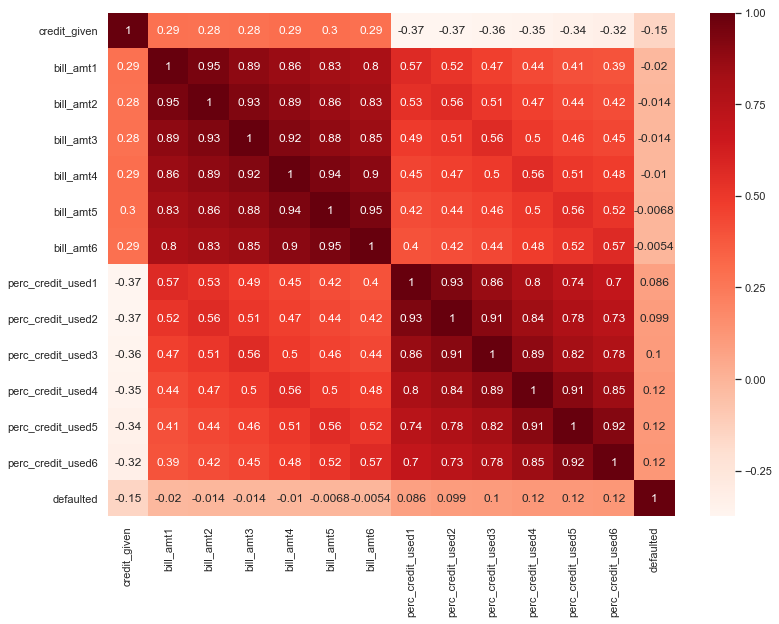

In [14]:


df = df.assign(
    perc_credit_used1=df["bill_amt1"].divide(df["credit_given"]),
    perc_credit_used2=df["bill_amt2"].divide(df["credit_given"]),
    perc_credit_used3=df["bill_amt3"].divide(df["credit_given"]),
    perc_credit_used4=df["bill_amt4"].divide(df["credit_given"]),
    perc_credit_used5=df["bill_amt5"].divide(df["credit_given"]),
    perc_credit_used6=df["bill_amt6"].divide(df["credit_given"]),
)

cols = [
    "credit_given",
    "bill_amt1",
    "bill_amt2",
    "bill_amt3",
    "bill_amt4",
    "bill_amt5",
    "bill_amt6",
    "perc_credit_used1",
    "perc_credit_used2",
    "perc_credit_used3",
    "perc_credit_used4",
    "perc_credit_used5",
    "perc_credit_used6",
    "defaulted",
]

cor = df[cols].corr()
sns.heatmap(cor, annot=True, cmap="Reds")
plt.show()


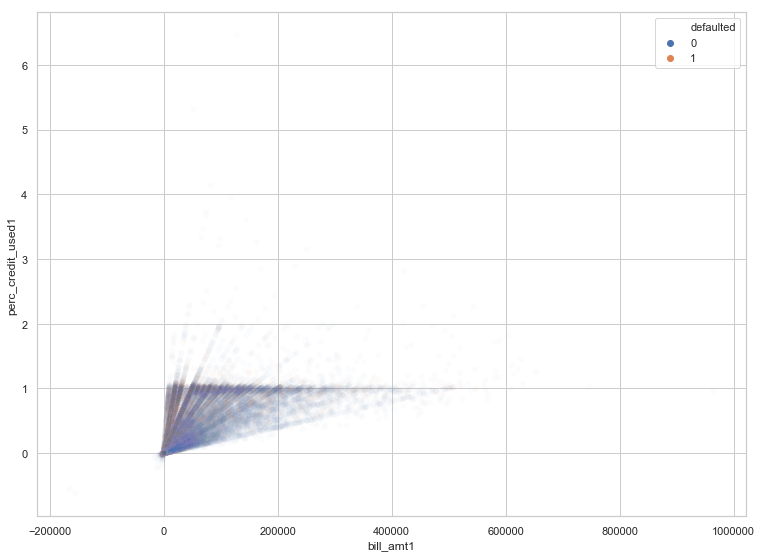

In [15]:

sns.scatterplot("bill_amt1", "perc_credit_used1", hue="defaulted", alpha=0.02, data=df)
plt.show()


 # Amount of Maximum Credit Used Change Over Time

 * Maybe changes in the credit used are more important than overall level
 * Calculating change in credit use percentage within month
 * Correlations are quite small, but negative as we would suspect (paying of larger chunks of the
 the dept makes default in the next month less likely)

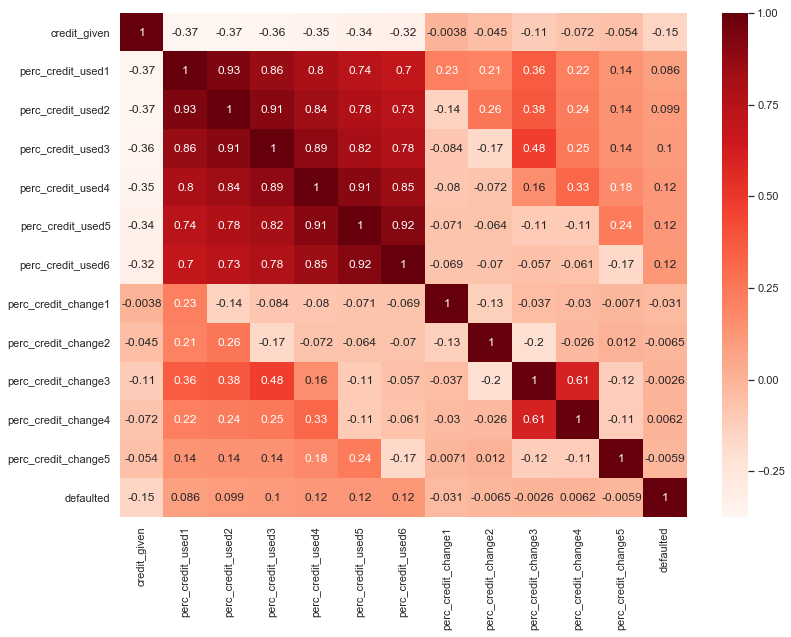

In [16]:

df = df.assign(
    perc_credit_change1=df["perc_credit_used1"] - df["perc_credit_used2"],
    perc_credit_change2=df["perc_credit_used2"] - df["perc_credit_used3"],
    perc_credit_change3=df["perc_credit_used3"] - df["perc_credit_used5"],
    perc_credit_change4=df["perc_credit_used4"] - df["perc_credit_used5"],
    perc_credit_change5=df["perc_credit_used5"] - df["perc_credit_used6"],
)

cols = [
    "credit_given",
    "perc_credit_used1",
    "perc_credit_used2",
    "perc_credit_used3",
    "perc_credit_used4",
    "perc_credit_used5",
    "perc_credit_used6",
    "perc_credit_change1",
    "perc_credit_change2",
    "perc_credit_change3",
    "perc_credit_change4",
    "perc_credit_change5",
    "defaulted",
]

cor = df[cols].corr()
sns.heatmap(cor, annot=True, cmap="Reds")
plt.show()

